In [18]:
from tqdm.notebook import tqdm
import cv2
from glob import glob
import random
from matplotlib import pyplot as plt


In [19]:
train_dir = glob("datasets/train/images/*.jpg")
val_dri = glob("datasets/valid/images/*.jpg")
print("train_dir", len(train_dir))
print("val_dir", len(val_dri))

train_dir 11502
val_dir 1095


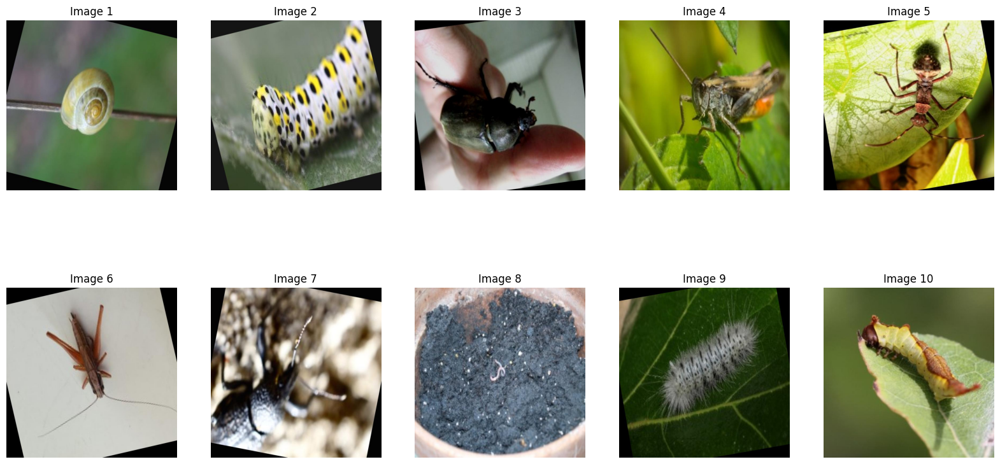

In [20]:
# Choosing 10 random images from the training set to visualize
random.seed(42)
random.shuffle(train_dir)
train_dir = train_dir[:10]
# Displaying the images
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}")

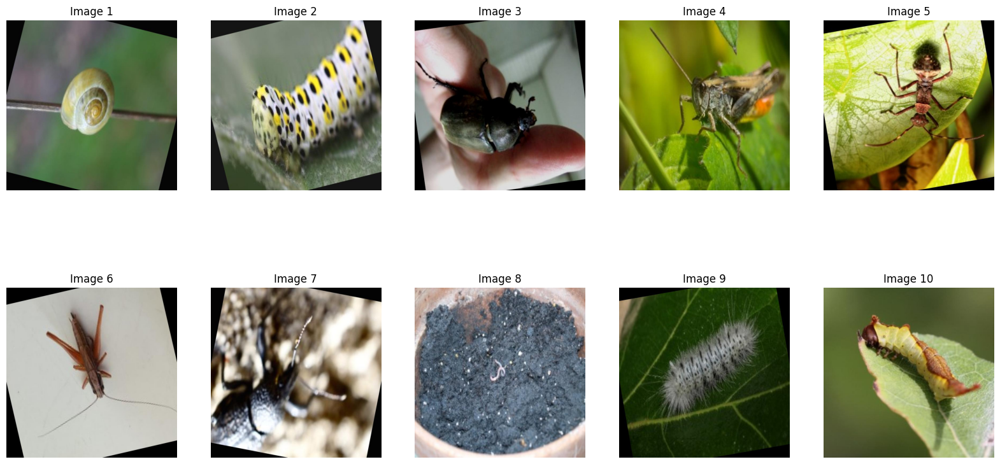

In [21]:
# Mirror Images

plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)[:, ::1, :]  # Flipping the image horizontally
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}")



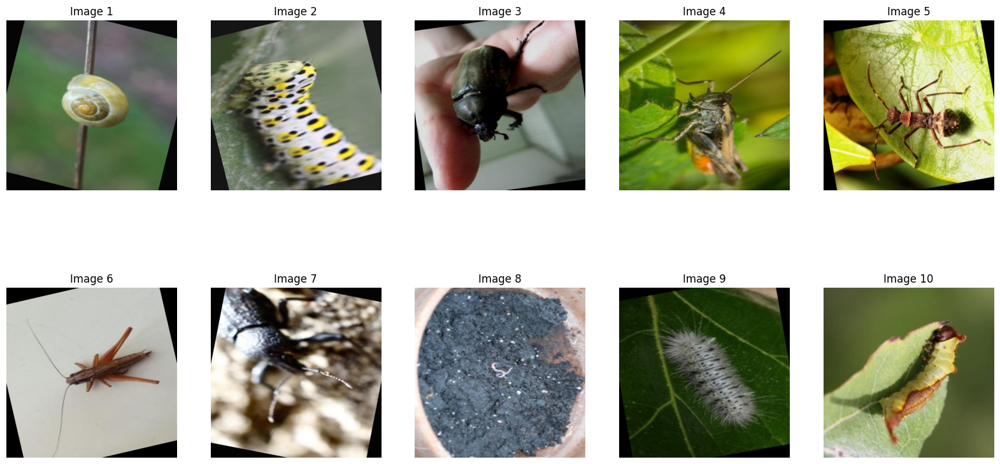

In [22]:
# 90 degree rotation
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)  # Rotating the image
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}")

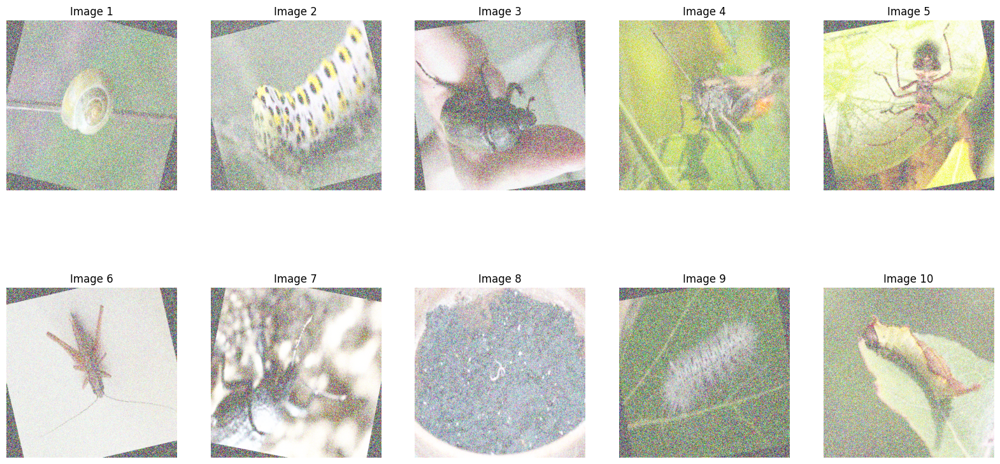

In [23]:
# Adding noise to images 
import numpy as np
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)  # Adding Gaussian noise
    noisy_img = cv2.add(img, noise)
    plt.subplot(2, 5, i + 1)
    plt.imshow(noisy_img)
    plt.axis('off')
    plt.title(f"Image {i+1}")

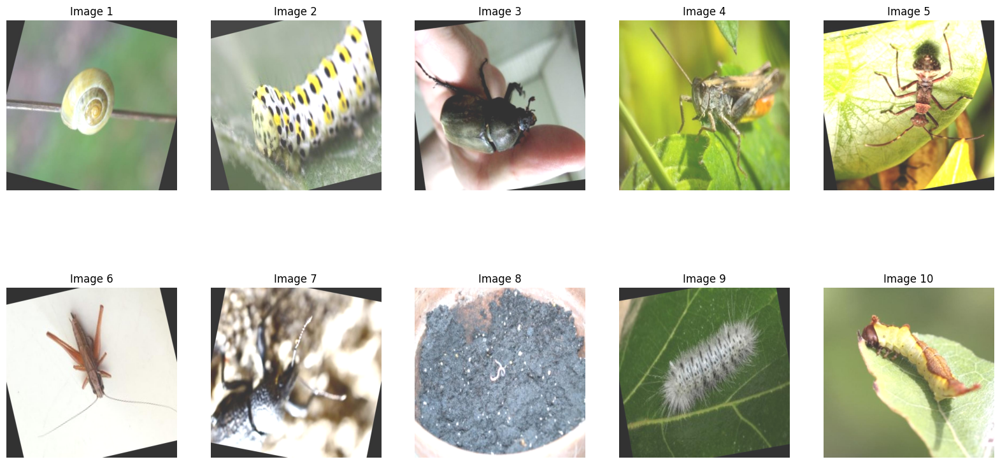

In [24]:
# INcreasing brightness
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    brightness = 50  # Increase brightness
    bright_img = cv2.add(img, (brightness, brightness, brightness, 0))
    plt.subplot(2, 5, i + 1)
    plt.imshow(bright_img)
    plt.axis('off')
    plt.title(f"Image {i+1}")

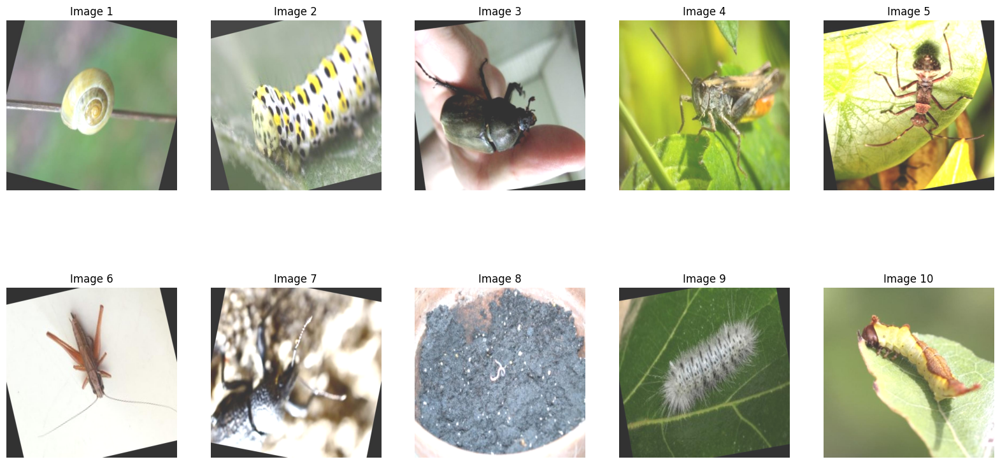

In [25]:
# Decreasing brightness
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    brightness = 50  # Decrease brightness
    dark_img = cv2.add(img, (brightness, brightness, brightness, 0))
    plt.subplot(2, 5, i + 1)
    plt.imshow(dark_img)
    plt.axis('off')
    plt.title(f"Image {i+1}")

In [26]:
# Applying bounding boxes to images
plt.figure(figsize=(20, 10))
for i, img_path in enumerate(train_dir):
    # assume annotation .txt are in a parallel "labels" folder:
    ann_path = img_path.replace(r"datasets/train/images", r"datasets/train/labels").replace(".jpg", ".txt")
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # read YOLO‐format annotations: class x_center y_center width height (all normalized)
    with open(ann_path, "r") as f:
        for line in f:
            cls, xc, yc, bw, bh = map(float, line.split())
            x1 = int((xc bw/2) * w)
            y1 = int((yc bh/2) * h)
            x2 = int((xc + bw/2) * w)
            y2 = int((yc + bh/2) * h)
            cv2.rectangle(img, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image {i+1}")
plt.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (217245945.py, line 14)

In [ ]:
from tqdm.notebook import tqdm
from ultralytics import YOLO
from glob import glob
import random
import numpy as np

In [ ]:
#Loading model
model = YOLO("Model/YOLO_V5.pt")  

In [29]:
result = model.predict("test.jpg",
              save = True,
              show_conf=False)


image 1/1 d:\Vrinda\test.jpg: 480x640 1 Ants, 276.8ms
Speed: 15.2ms preprocess, 276.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to Vrinda_API\predict2


In [9]:
res = result[0]
class_ids = res.boxes.cls.tolist()
class_names = [ model.names[int(cid)] for cid in class_ids]
class_names

['Ants']

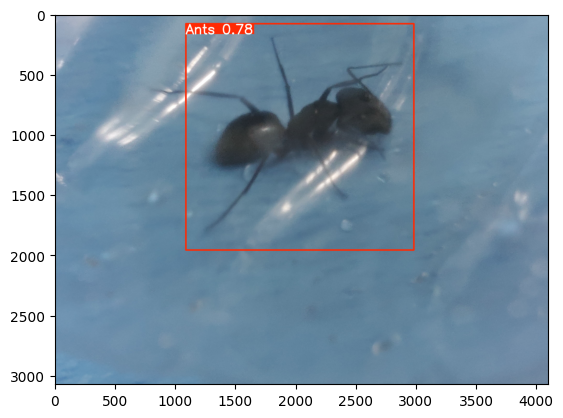

In [17]:
import base64
import cv2
from matplotlib import pyplot as plt

annotated = res.plot()

cv2.imwrite("result.jpg", annotated)
plt.imshow(annotated)

In [31]:
# Making 5 random predictions on the test set
test_dir = glob(r"Datasets/test/images/*.jpg")
f"Number of test images: {len(test_dir)}"
result = []
for i in tqdm(range(50)):
    pred = model.predict(random.choice(test_dir),save= True,show_conf = False)
    result.append(pred)
result

  0%|          | 0/50 [00:00<?, ?it/s]


image 1/1 d:\Vrinda\Datasets\test\images\ants-58-_jpg.rf.598d7f1bc585c7cbe7768c846b538e86.jpg: 640x640 1 Ants, 363.9ms
Speed: 20.1ms preprocess, 363.9ms inference, 10.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to Vrinda_API\predict2

image 1/1 d:\Vrinda\Datasets\test\images\earthworms-135-_jpg.rf.043a9953d8e3f4e7bf6d817114cb2344.jpg: 640x640 3 Earthwormss, 241.1ms
Speed: 7.6ms preprocess, 241.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to Vrinda_API\predict2

image 1/1 d:\Vrinda\Datasets\test\images\ants-398-_jpg.rf.ff064a7ec5850f14605ca6530e7b02c2.jpg: 640x640 1 Ants, 240.1ms
Speed: 15.8ms preprocess, 240.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to Vrinda_API\predict2

image 1/1 d:\Vrinda\Datasets\test\images\ants-112-_jpg.rf.b8d6b9acf9fa1edfb438381cbae99199.jpg: 640x640 1 Ants, 1 Earwigs, 290.7ms
Speed: 137.9ms preprocess, 290.7ms inference, 1.3ms postprocess per image at shape (1

[[ultralytics.engine.results.Results object with attributes:
  
  boxes: ultralytics.engine.results.Boxes object
  keypoints: None
  masks: None
  names: {0: 'Ants', 1: 'Bees', 2: 'Beetles', 3: 'Caterpillars', 4: 'Earthworms', 5: 'Earwigs', 6: 'Grasshoppers', 7: 'Moths', 8: 'Slugs', 9: 'Snails', 10: 'Wasps', 11: 'Weevils'}
  obb: None
  orig_img: array([[[234, 253, 250],
          [234, 253, 250],
          [234, 253, 250],
          ...,
          [170, 242, 254],
          [172, 242, 255],
          [175, 243, 255]],
  
         [[234, 253, 250],
          [234, 253, 250],
          [233, 252, 249],
          ...,
          [173, 245, 255],
          [175, 245, 255],
          [177, 245, 255]],
  
         [[232, 253, 251],
          [231, 252, 250],
          [231, 252, 250],
          ...,
          [172, 243, 255],
          [174, 244, 255],
          [175, 245, 255]],
  
         ...,
  
         [[ 68, 192, 246],
          [ 69, 193, 247],
          [ 70, 194, 248],
          ..